In [1]:
import shutil
import os

DST_DIR = "/home/harry/Re_leaf_Project/tomato_real_38cls_preprocessed"

if os.path.exists(DST_DIR):
    shutil.rmtree(DST_DIR)

print("기존 전처리 폴더 삭제 완료")

기존 전처리 폴더 삭제 완료


In [1]:
# =========================================================
# 이미지 품질 보정 + 배경 최소화 함수
# =========================================================

import cv2
import numpy as np
from PIL import Image

def enhance_and_crop_leaf(img_path, show=False):
    # 이미지 읽기
    img_bgr = cv2.imread(img_path)

    if img_bgr is None:
        raise ValueError(f"이미지를 읽을 수 없습니다: {img_path}")

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # 대비 보정
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)

    # 노이즈 완화
    denoised = cv2.fastNlMeansDenoisingColored(
        enhanced,
        None,
        h=5,
        hColor=5,
        templateWindowSize=7,
        searchWindowSize=21
    )

    # 샤프닝
    kernel = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ])

    sharpened = cv2.filter2D(denoised, -1, kernel)

    # 초록색 잎 영역 마스크
    hsv = cv2.cvtColor(sharpened, cv2.COLOR_RGB2HSV)

    lower_green = np.array([25, 30, 30])
    upper_green = np.array([95, 255, 255])

    mask = cv2.inRange(hsv, lower_green, upper_green)
    mask = cv2.medianBlur(mask, 7)

    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    # 가장 큰 초록 영역 기준 crop
    if len(contours) > 0:
        largest = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest)

        pad = 30
        x1 = max(x - pad, 0)
        y1 = max(y - pad, 0)
        x2 = min(x + w + pad, sharpened.shape[1])
        y2 = min(y + h + pad, sharpened.shape[0])

        cropped = sharpened[y1:y2, x1:x2]
    else:
        cropped = sharpened

    return Image.fromarray(cropped)

In [2]:
# =========================================================
# 토마토 4개 클래스 전처리 이미지 생성
# =========================================================

import os

SRC_DIR = "/home/harry/Re_leaf_Project/tomato_real_38cls"
DST_DIR = "/home/harry/Re_leaf_Project/tomato_real_38cls_preprocessed"

os.makedirs(DST_DIR, exist_ok=True)

for class_name in os.listdir(SRC_DIR):
    src_class_dir = os.path.join(SRC_DIR, class_name)

    if not os.path.isdir(src_class_dir):
        continue

    dst_class_dir = os.path.join(DST_DIR, class_name)
    os.makedirs(dst_class_dir, exist_ok=True)

    count = 0

    for fname in os.listdir(src_class_dir):
        if not fname.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
            continue

        src_path = os.path.join(src_class_dir, fname)

        try:
            processed_img = enhance_and_crop_leaf(src_path, show=False)

            name, _ = os.path.splitext(fname)
            save_path = os.path.join(dst_class_dir, f"{name}_preprocessed.jpg")

            processed_img.save(save_path, quality=95)
            count += 1

        except Exception as e:
            print("전처리 실패:", src_path, e)

    print(class_name, "전처리 완료:", count, "장")

print("전처리 데이터셋 생성 완료")

Tomato__Septoria_leaf_spot 전처리 완료: 137 장
Tomato__Bacterial_spot 전처리 완료: 99 장
Tomato__Early_blight 전처리 완료: 96 장
Tomato__Late_blight 전처리 완료: 74 장
전처리 데이터셋 생성 완료


In [45]:
# =========================================================
# 0. 기본 세팅
# =========================================================

import os
import json
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

import torch.nn as nn
import torch.optim as optim

from torchvision import transforms, models, datasets
from torch.utils.data import DataLoader, ConcatDataset, Dataset

# GPU 설정
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 기본 하이퍼파라미터
IMG_SIZE = 224
BATCH_SIZE = 32

print("DEVICE:", DEVICE)

DEVICE: cuda


In [66]:
# =========================================================
# 1. 전처리 Transform
# =========================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [12]:
# =========================================================
# 2. EfficientNetB0 모델 생성 함수
# =========================================================

def create_model(num_classes):
    model = models.efficientnet_b0(
        weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1
    )

    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)

    return model.to(DEVICE)

In [13]:
# =========================================================
# 3. 학습 함수
# =========================================================

def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    total_loss = 0
    total_correct = 0
    total_count = 0

    for x, y in loader:
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        optimizer.zero_grad()

        out = model(x)
        loss = criterion(out, y)

        loss.backward()
        optimizer.step()

        pred = out.argmax(dim=1)

        total_loss += loss.item() * x.size(0)
        total_correct += (pred == y).sum().item()
        total_count += y.size(0)

    return total_loss / total_count, total_correct / total_count

In [14]:
# =========================================================
# 4. 평가 함수
# =========================================================

def evaluate(model, loader, criterion):
    model.eval()

    total_loss = 0
    total_correct = 0
    total_count = 0

    with torch.no_grad():
        for x, y in loader:
            x = x.to(DEVICE)
            y = y.to(DEVICE)

            out = model(x)
            loss = criterion(out, y)

            pred = out.argmax(dim=1)

            total_loss += loss.item() * x.size(0)
            total_correct += (pred == y).sum().item()
            total_count += y.size(0)

    return total_loss / total_count, total_correct / total_count

In [15]:
# =========================================================
# 5. 클래스 / 기존 모델 로드
# =========================================================

CLASS_PATH = "class_names_38cls.json"
BASE_MODEL_PATH = "model_reaf_ai_effb0_38cls_finetuned.pth"

with open(CLASS_PATH, "r", encoding="utf-8") as f:
    class_38 = json.load(f)

num_classes = len(class_38)

model_pre_extra = create_model(num_classes)

model_pre_extra.load_state_dict(
    torch.load(BASE_MODEL_PATH, map_location=DEVICE)
)

model_pre_extra.to(DEVICE)
print("기존 38cls extra406 모델 로드 완료")

기존 38cls extra406 모델 로드 완료


/tmp/ipykernel_1838/2481842980.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(BASE_MODEL_PATH, map_location=DEVICE)


In [16]:
# =========================================================
# 6. 전처리 이미지 데이터셋 로드
# =========================================================

PREPROCESSED_DIR = "/home/harry/Re_leaf_Project/tomato_real_38cls_preprocessed"

preprocessed_ds = datasets.ImageFolder(
    PREPROCESSED_DIR,
    transform=train_transform
)

preprocessed_loader = DataLoader(
    preprocessed_ds,
    batch_size=BATCH_SIZE,
    shuffle=True
)

print("전처리 이미지 수:", len(preprocessed_ds))
print("전처리 클래스:", preprocessed_ds.classes)

전처리 이미지 수: 406
전처리 클래스: ['Tomato__Bacterial_spot', 'Tomato__Early_blight', 'Tomato__Late_blight', 'Tomato__Septoria_leaf_spot']


In [17]:
# =========================================================
# 7. 추가 학습 설정
# =========================================================

# 전체 freeze
for p in model_pre_extra.parameters():
    p.requires_grad = False

# classifier 학습
for p in model_pre_extra.classifier.parameters():
    p.requires_grad = True

# EfficientNet 뒤쪽 일부 학습
layers = list(model_pre_extra.features.children())

for layer in layers[-20:]:
    for p in layer.parameters():
        p.requires_grad = True

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model_pre_extra.parameters()),
    lr=1e-5
)

EPOCHS_PRE = 5

In [18]:
# =========================================================
# 8. 전처리 데이터 추가 학습
# =========================================================

for epoch in range(EPOCHS_PRE):
    train_loss, train_acc = train_one_epoch(
        model_pre_extra,
        preprocessed_loader,
        criterion,
        optimizer
    )

    print(
        f"[Preprocessed Extra {epoch+1}/{EPOCHS_PRE}] "
        f"loss:{train_loss:.4f} acc:{train_acc:.4f}"
    )

torch.save(
    model_pre_extra.state_dict(),
    "model_reaf_ai_effb0_38cls_extra406_preprocessed_finetuned.pth"
)

print("전처리 추가학습 모델 저장 완료")

[Preprocessed Extra 1/5] loss:9.6298 acc:0.0468
[Preprocessed Extra 2/5] loss:9.0253 acc:0.0493
[Preprocessed Extra 3/5] loss:8.4550 acc:0.0468
[Preprocessed Extra 4/5] loss:7.7758 acc:0.0690
[Preprocessed Extra 5/5] loss:7.4580 acc:0.1010
전처리 추가학습 모델 저장 완료


/tmp/ipykernel_1838/2604794878.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
/home/harry/miniconda3

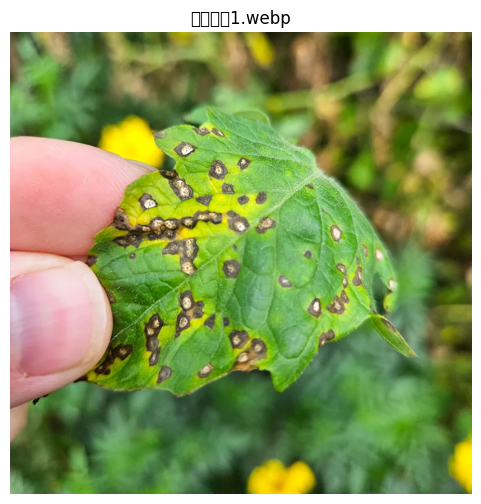

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아1.webp
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Bacterial_spot / 신뢰도: 0.0311
2위: Tomato___Target_Spot / 신뢰도: 0.0055
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0018
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0009
5위: Tomato___Early_blight / 신뢰도: 0.0007
최종 판단: 판단 어려움 (0.03)

[전처리 추가학습 모델 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0698
2위: Tomato___Early_blight / 신뢰도: 0.0352
3위: Tomato___Bacterial_spot / 신뢰도: 0.0346
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0206
5위: Tomato___Target_Spot / 신뢰도: 0.0062
최종 판단: 판단 어려움 (0.07)

[비교]
기존 모델 Top1    : Tomato___Bacterial_spot / 0.0311
전처리 추가 Top1 : Tomato___Septoria_leaf_spot / 0.0698
신뢰도 차이       : +0.0387


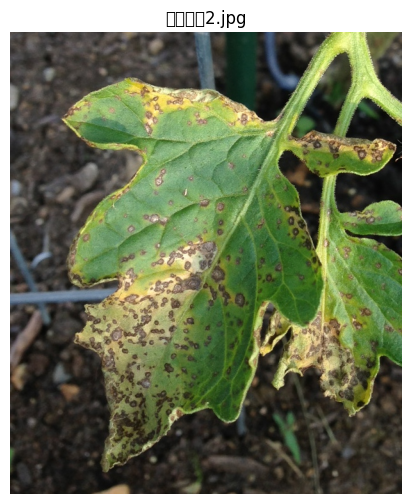

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___healthy / 신뢰도: 0.0583
2위: Tomato___Early_blight / 신뢰도: 0.0120
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0074
4위: Tomato___Target_Spot / 신뢰도: 0.0032
5위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0004
최종 판단: 판단 어려움 (0.06)

[전처리 추가학습 모델 결과]
1위: Tomato___healthy / 신뢰도: 0.0843
2위: Tomato___Leaf_Mold / 신뢰도: 0.0199
3위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0196
4위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0147
5위: Tomato___Early_blight / 신뢰도: 0.0089
최종 판단: 판단 어려움 (0.08)

[비교]
기존 모델 Top1    : Tomato___healthy / 0.0583
전처리 추가 Top1 : Tomato___healthy / 0.0843
신뢰도 차이       : +0.0260


/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 45572 (\N{HANGUL SYLLABLE NU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 45180 (\N{HANGUL SYLLABLE GGI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


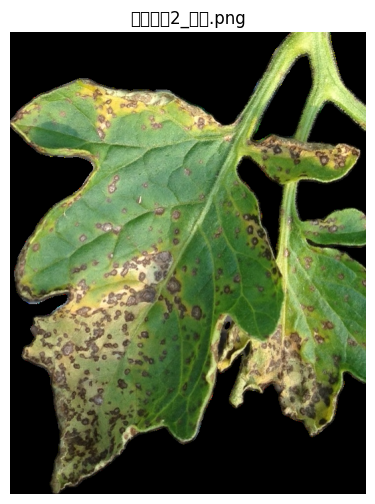

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___healthy / 신뢰도: 0.1050
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0588
3위: Tomato___Early_blight / 신뢰도: 0.0272
4위: Tomato___Late_blight / 신뢰도: 0.0158
5위: Tomato___Target_Spot / 신뢰도: 0.0034
최종 판단: 판단 어려움 (0.10)

[전처리 추가학습 모델 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.6224
2위: Tomato___Early_blight / 신뢰도: 0.0674
3위: Tomato___Late_blight / 신뢰도: 0.0246
4위: Tomato___healthy / 신뢰도: 0.0146
5위: Tomato___Leaf_Mold / 신뢰도: 0.0053
최종 판단: 판단 어려움 (0.62)

[비교]
기존 모델 Top1    : Tomato___healthy / 0.1050
전처리 추가 Top1 : Tomato___Septoria_leaf_spot / 0.6224
신뢰도 차이       : +0.5174


/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 50669 (\N{HANGUL SYLLABLE YEOG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 48337 (\N{HANGUL SYLLABLE BYEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


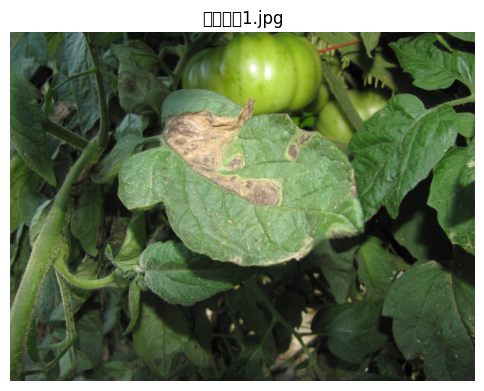

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병1.jpg
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Early_blight / 신뢰도: 0.1978
2위: Tomato___Late_blight / 신뢰도: 0.1279
3위: Tomato___Target_Spot / 신뢰도: 0.0911
4위: Tomato___Bacterial_spot / 신뢰도: 0.0100
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0094
최종 판단: 판단 어려움 (0.20)

[전처리 추가학습 모델 결과]
1위: Tomato___Late_blight / 신뢰도: 0.8317
2위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0244
3위: Tomato___healthy / 신뢰도: 0.0138
4위: Tomato___Leaf_Mold / 신뢰도: 0.0109
5위: Tomato___Early_blight / 신뢰도: 0.0017
최종 판단: Tomato___Late_blight (0.83)

[비교]
기존 모델 Top1    : Tomato___Early_blight / 0.1978
전처리 추가 Top1 : Tomato___Late_blight / 0.8317
신뢰도 차이       : +0.6340


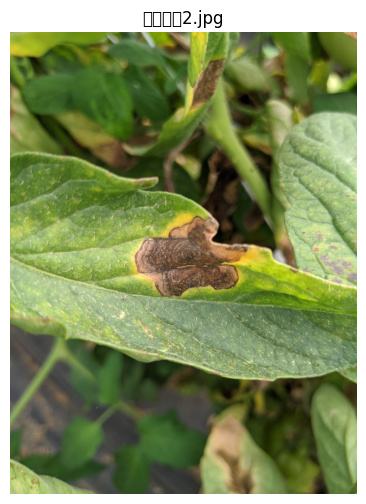

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병2.jpg
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Early_blight / 신뢰도: 0.9580
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0128
3위: Tomato___Late_blight / 신뢰도: 0.0017
4위: Tomato___Target_Spot / 신뢰도: 0.0014
5위: Tomato___Bacterial_spot / 신뢰도: 0.0012
최종 판단: Tomato___Early_blight (0.96)

[전처리 추가학습 모델 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9960
2위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0011
3위: Tomato___Bacterial_spot / 신뢰도: 0.0009
4위: Tomato___Leaf_Mold / 신뢰도: 0.0002
5위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0001
최종 판단: Tomato___Septoria_leaf_spot (1.00)

[비교]
기존 모델 Top1    : Tomato___Early_blight / 0.9580
전처리 추가 Top1 : Tomato___Septoria_leaf_spot / 0.9960
신뢰도 차이       : +0.0381


/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51216 (\N{HANGUL SYLLABLE JEOM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 47924 (\N{HANGUL SYLLABLE MU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 45740 (\N{HANGUL SYLLABLE NYI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


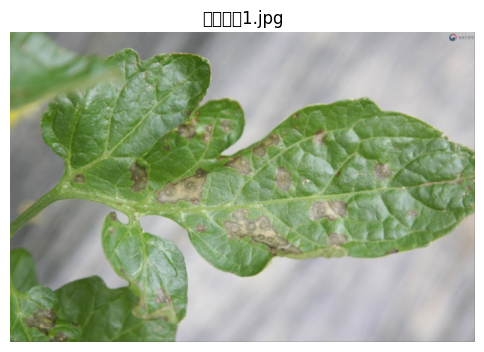

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0025
2위: Tomato___Late_blight / 신뢰도: 0.0010
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
4위: Tomato___healthy / 신뢰도: 0.0000
5위: Tomato___Leaf_Mold / 신뢰도: 0.0000
최종 판단: 판단 어려움 (0.00)

[전처리 추가학습 모델 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0229
2위: Tomato___Late_blight / 신뢰도: 0.0008
3위: Tomato___healthy / 신뢰도: 0.0003
4위: Tomato___Leaf_Mold / 신뢰도: 0.0002
5위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0001
최종 판단: 판단 어려움 (0.02)

[비교]
기존 모델 Top1    : Tomato___Early_blight / 0.0025
전처리 추가 Top1 : Tomato___Septoria_leaf_spot / 0.0229
신뢰도 차이       : +0.0203


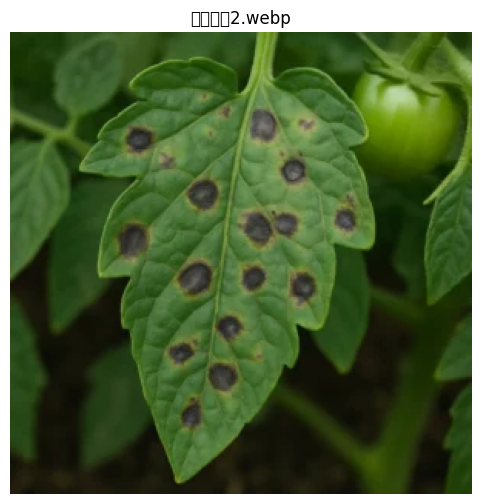

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병2.webp
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Early_blight / 신뢰도: 0.6601
2위: Tomato___Late_blight / 신뢰도: 0.2043
3위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0095
4위: Tomato___Target_Spot / 신뢰도: 0.0075
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0008
최종 판단: 판단 어려움 (0.66)

[전처리 추가학습 모델 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.6688
2위: Tomato___Late_blight / 신뢰도: 0.0465
3위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0304
4위: Tomato___healthy / 신뢰도: 0.0255
5위: Tomato___Leaf_Mold / 신뢰도: 0.0151
최종 판단: 판단 어려움 (0.67)

[비교]
기존 모델 Top1    : Tomato___Early_blight / 0.6601
전처리 추가 Top1 : Tomato___Septoria_leaf_spot / 0.6688
신뢰도 차이       : +0.0086


/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 54980 (\N{HANGUL SYLLABLE HU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


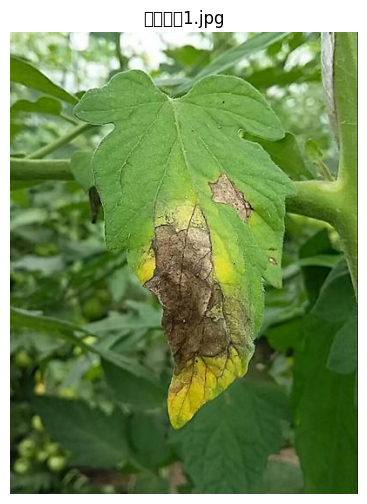

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병1.jpg
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9395
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0022
3위: Tomato___Early_blight / 신뢰도: 0.0001
4위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0001
5위: Tomato___Leaf_Mold / 신뢰도: 0.0001
최종 판단: Tomato___Late_blight (0.94)

[전처리 추가학습 모델 결과]
1위: Tomato___Late_blight / 신뢰도: 0.4069
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.1870
3위: Tomato___Leaf_Mold / 신뢰도: 0.0138
4위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0013
5위: Tomato___Bacterial_spot / 신뢰도: 0.0001
최종 판단: 판단 어려움 (0.41)

[비교]
기존 모델 Top1    : Tomato___Late_blight / 0.9395
전처리 추가 Top1 : Tomato___Late_blight / 0.4069
신뢰도 차이       : -0.5325


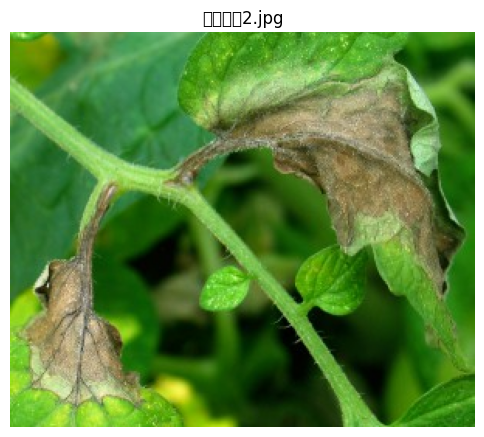

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병2.jpg
선택 작물: Tomato

[기존 모델 결과]
1위: Tomato___Late_blight / 신뢰도: 0.2928
2위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0003
3위: Tomato___Target_Spot / 신뢰도: 0.0001
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Early_blight / 신뢰도: 0.0000
최종 판단: 판단 어려움 (0.29)

[전처리 추가학습 모델 결과]
1위: Tomato___Late_blight / 신뢰도: 0.5778
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0105
3위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0024
4위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0017
5위: Tomato___Leaf_Mold / 신뢰도: 0.0003
최종 판단: 판단 어려움 (0.58)

[비교]
기존 모델 Top1    : Tomato___Late_blight / 0.2928
전처리 추가 Top1 : Tomato___Late_blight / 0.5778
신뢰도 차이       : +0.2850


In [19]:
# -------------------------
# 모델 로드 함수
# -------------------------
def load_model(weight_path, num_classes):
    model = create_model(num_classes)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()
    return model

# -------------------------
# class_names 로드
# -------------------------
with open("class_names_38cls.json", "r", encoding="utf-8") as f:
    class_38 = json.load(f)

# -------------------------
# 비교할 모델 2개 로드
# -------------------------
model_base = load_model(
    "model_reaf_ai_effb0_38cls_extra406_finetuned.pth",
    len(class_38)
)

model_pre = load_model(
    "model_reaf_ai_effb0_38cls_extra406_preprocessed_finetuned.pth",
    len(class_38)
)

# -------------------------
# 테스트 이미지 리스트
# -------------------------
test_images = [
    "/home/harry/Re_leaf_Project/Test_image/셉토리아1.webp",
    "/home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg",
    "/home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png",
    "/home/harry/Re_leaf_Project/Test_image/전기역병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/전기역병2.jpg",
    "/home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/점무늬병2.webp",
    "/home/harry/Re_leaf_Project/Test_image/후기역병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/후기역병2.jpg",
]

# -------------------------
# 작물 필터링 예측 결과 반환 함수
# -------------------------
def get_filtered_topk(model, class_names, img, selected_crop="Tomato", topk=5):
    model.eval()

    x = val_transform(img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        out = model(x)
        probs = torch.softmax(out, dim=1)[0]

    filtered_indices = [
        i for i, name in enumerate(class_names)
        if name.startswith(selected_crop + "___")
    ]

    filtered_probs = probs[filtered_indices]

    top_values, top_positions = torch.topk(
        filtered_probs,
        k=min(topk, len(filtered_indices))
    )

    results = []

    for value, pos in zip(top_values, top_positions):
        original_idx = filtered_indices[pos.item()]
        results.append((class_names[original_idx], value.item()))

    return results

# -------------------------
# 이미지 1장 기준 비교 출력
# -------------------------
def compare_two_models_on_image(img_path, selected_crop="Tomato", threshold=0.7):
    img = Image.open(img_path).convert("RGB")

    base_results = get_filtered_topk(
        model_base,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    pre_results = get_filtered_topk(
        model_pre,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis("off")
    plt.show()

    print("=" * 80)
    print("이미지:", img_path)
    print("선택 작물:", selected_crop)
    print("=" * 80)

    print("\n[기존 모델 결과]")
    for i, (name, conf) in enumerate(base_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    base_top_name, base_top_conf = base_results[0]
    if base_top_conf < threshold:
        print(f"최종 판단: 판단 어려움 ({base_top_conf:.2f})")
    else:
        print(f"최종 판단: {base_top_name} ({base_top_conf:.2f})")

    print("\n[전처리 추가학습 모델 결과]")
    for i, (name, conf) in enumerate(pre_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    pre_top_name, pre_top_conf = pre_results[0]
    if pre_top_conf < threshold:
        print(f"최종 판단: 판단 어려움 ({pre_top_conf:.2f})")
    else:
        print(f"최종 판단: {pre_top_name} ({pre_top_conf:.2f})")

    print("\n[비교]")
    print(f"기존 모델 Top1    : {base_top_name} / {base_top_conf:.4f}")
    print(f"전처리 추가 Top1 : {pre_top_name} / {pre_top_conf:.4f}")
    print(f"신뢰도 차이       : {pre_top_conf - base_top_conf:+.4f}")

# -------------------------
# 전체 테스트 실행
# -------------------------
for img_path in test_images:
    compare_two_models_on_image(
        img_path,
        selected_crop="Tomato",
        threshold=0.7
    )

ConvNext Tiny 모델

In [20]:
STAGE1_EPOCHS = 10
FINE_EPOCHS = 5

LR_STAGE1 = 1e-3
LR_FINE = 1e-5

# =========================================================
# 1. 데이터 경로
# =========================================================

DATA_38_TRAIN_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
DATA_38_VAL_DIR   = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# 토마토 4개 클래스 extra 데이터셋
TOMATO_EXTRA_DIR = "/home/harry/Re_leaf_Project/tomato_real_38cls"

In [21]:
# =========================================================
# 2. 전처리
# =========================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(
        brightness=0.1,
        contrast=0.1,
        saturation=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [22]:
# =========================================================
# 3. ConvNeXt Tiny 모델 생성 함수
# =========================================================

def create_convnext_tiny(num_classes):
    weights = models.ConvNeXt_Tiny_Weights.DEFAULT

    model = models.convnext_tiny(weights=weights)

    in_features = model.classifier[2].in_features
    model.classifier[2] = nn.Linear(in_features, num_classes)

    return model.to(DEVICE)

In [23]:
# =========================================================
# 4. 학습 함수
# =========================================================

def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    total_loss = 0
    total_correct = 0
    total_count = 0

    for x, y in loader:
        x = x.to(DEVICE)
        y = y.to(DEVICE)

        optimizer.zero_grad()

        out = model(x)
        loss = criterion(out, y)

        loss.backward()
        optimizer.step()

        pred = out.argmax(dim=1)

        total_loss += loss.item() * x.size(0)
        total_correct += (pred == y).sum().item()
        total_count += y.size(0)

    return total_loss / total_count, total_correct / total_count


def evaluate(model, loader, criterion):
    model.eval()

    total_loss = 0
    total_correct = 0
    total_count = 0

    with torch.no_grad():
        for x, y in loader:
            x = x.to(DEVICE)
            y = y.to(DEVICE)

            out = model(x)
            loss = criterion(out, y)

            pred = out.argmax(dim=1)

            total_loss += loss.item() * x.size(0)
            total_correct += (pred == y).sum().item()
            total_count += y.size(0)

    return total_loss / total_count, total_correct / total_count

In [26]:
# =========================================================
# 5. 데이터셋 로드
# =========================================================

train_pv_ds = datasets.ImageFolder(
    DATA_38_TRAIN_DIR,
    transform=train_transform
)

val_ds = datasets.ImageFolder(
    DATA_38_VAL_DIR,
    transform=val_transform
)

tomato_extra_ds = datasets.ImageFolder(
    TOMATO_EXTRA_DIR,
    transform=train_transform
)

# 클래스 순서 확인
class_names = train_pv_ds.classes
num_classes = len(class_names)

print("38클래스 개수:", num_classes)
print("토마토 extra 클래스:", tomato_extra_ds.classes)
print("PlantVillage train 수:", len(train_pv_ds))
print("Tomato extra 수:", len(tomato_extra_ds))

# class_names 저장
with open("class_names_38cls_convnext.json", "w", encoding="utf-8") as f:
    json.dump(class_names, f, ensure_ascii=False, indent=4)

# PlantVillage + tomato extra 합치기
train_combined_ds = ConcatDataset([
    train_pv_ds,
    tomato_extra_ds
])

train_loader = DataLoader(
    train_combined_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

38클래스 개수: 38
토마토 extra 클래스: ['Tomato__Bacterial_spot', 'Tomato__Early_blight', 'Tomato__Late_blight', 'Tomato__Septoria_leaf_spot']
PlantVillage train 수: 70295
Tomato extra 수: 406


In [42]:
# =========================================================
# 6. Stage1 학습: classifier만 학습
# =========================================================

model_convnext = create_convnext_tiny(num_classes)
criterion = nn.CrossEntropyLoss()

# features 고정
for p in model_convnext.features.parameters():
    p.requires_grad = False

# classifier 학습
for p in model_convnext.classifier.parameters():
    p.requires_grad = True

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model_convnext.parameters()),
    lr=LR_STAGE1
)

best_acc = 0.0

for epoch in range(STAGE1_EPOCHS):
    train_loss, train_acc = train_one_epoch(
        model_convnext,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = evaluate(
        model_convnext,
        val_loader,
        criterion
    )

    print(
        f"[ConvNeXt 38cls Stage1 {epoch+1}/{STAGE1_EPOCHS}] "
        f"train:{train_acc:.4f} val:{val_acc:.4f}"
    )

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(
            model_convnext.state_dict(),
            "cp_convnext_tiny_38cls_stage1.pth"
        )

torch.save(
    model_convnext.state_dict(),
    "model_convnext_tiny_38cls_stage1.pth"
)

print("ConvNeXt Stage1 저장 완료")

[ConvNeXt 38cls Stage1 1/10] train:0.9379 val:0.9781
[ConvNeXt 38cls Stage1 2/10] train:0.9775 val:0.9833
[ConvNeXt 38cls Stage1 3/10] train:0.9829 val:0.9858
[ConvNeXt 38cls Stage1 4/10] train:0.9846 val:0.9859
[ConvNeXt 38cls Stage1 5/10] train:0.9863 val:0.9862
[ConvNeXt 38cls Stage1 6/10] train:0.9872 val:0.9885
[ConvNeXt 38cls Stage1 7/10] train:0.9882 val:0.9887
[ConvNeXt 38cls Stage1 8/10] train:0.9890 val:0.9887
[ConvNeXt 38cls Stage1 9/10] train:0.9898 val:0.9884
[ConvNeXt 38cls Stage1 10/10] train:0.9894 val:0.9875
ConvNeXt Stage1 저장 완료


In [43]:
# =========================================================
# 7. Fine-tuning: 뒤쪽 일부 레이어 + classifier 학습
# =========================================================

# 전체 freeze
for p in model_convnext.parameters():
    p.requires_grad = False

# classifier 학습
for p in model_convnext.classifier.parameters():
    p.requires_grad = True

# ConvNeXt features 뒤쪽 20개 leaf module 학습
leaf_modules = []

for name, module in model_convnext.features.named_modules():
    if len(list(module.children())) == 0:
        leaf_modules.append((name, module))

print("leaf module 개수:", len(leaf_modules))

for name, module in leaf_modules[-20:]:
    for p in module.parameters():
        p.requires_grad = True

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model_convnext.parameters()),
    lr=LR_FINE
)

best_acc = 0.0

for epoch in range(FINE_EPOCHS):
    train_loss, train_acc = train_one_epoch(
        model_convnext,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = evaluate(
        model_convnext,
        val_loader,
        criterion
    )

    print(
        f"[ConvNeXt 38cls Fine {epoch+1}/{FINE_EPOCHS}] "
        f"train:{train_acc:.4f} val:{val_acc:.4f}"
    )

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(
            model_convnext.state_dict(),
            "cp_convnext_tiny_38cls_finetuned.pth"
        )

torch.save(
    model_convnext.state_dict(),
    "model_convnext_tiny_38cls_finetuned.pth"
)

print("ConvNeXt Fine-tuned 저장 완료")

leaf module 개수: 152
[ConvNeXt 38cls Fine 1/5] train:0.9927 val:0.9921
[ConvNeXt 38cls Fine 2/5] train:0.9947 val:0.9933
[ConvNeXt 38cls Fine 3/5] train:0.9959 val:0.9936
[ConvNeXt 38cls Fine 4/5] train:0.9961 val:0.9943
[ConvNeXt 38cls Fine 5/5] train:0.9965 val:0.9947
ConvNeXt Fine-tuned 저장 완료


In [29]:
# =========================================================
# 8. ConvNeXt 모델 로드 함수
# =========================================================

def load_convnext_model(weight_path, num_classes):
    model = create_convnext_tiny(num_classes)
    model.load_state_dict(
        torch.load(weight_path, map_location=DEVICE)
    )
    model.to(DEVICE)
    model.eval()
    return model

In [31]:
# -------------------------
# class names
# -------------------------
with open("class_names_38cls.json", "r", encoding="utf-8") as f:
    class_38 = json.load(f)

num_classes = len(class_38)

# -------------------------
# 모델 로드 함수
# -------------------------
def load_effb0_model(weight_path, num_classes):
    model = create_model(num_classes)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()
    return model

# -------------------------
# 모델 로드
# -------------------------
model_effb0_fine = load_effb0_model(
    "model_reaf_ai_effb0_38cls_finetuned.pth",
    num_classes
)

model_convnext_fine = load_convnext_model(
    "model_convnext_tiny_38cls_finetuned.pth",
    num_classes
)

print("모델 로드 완료")

/tmp/ipykernel_1838/1005607494.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(weight_path, map_location=DEVICE))


모델 로드 완료


/tmp/ipykernel_1838/3183091294.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(weight_path, map_location=DEVICE)


In [32]:
# =========================================================
# 작물 필터링 Top-5 함수
# =========================================================

def get_crop_filtered_topk(model, class_names, img, selected_crop="Tomato", topk=5):
    model.eval()

    x = val_transform(img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        out = model(x)
        probs = torch.softmax(out, dim=1)[0]

    filtered_indices = [
        i for i, name in enumerate(class_names)
        if name.startswith(selected_crop + "___")
    ]

    filtered_probs = probs[filtered_indices]

    top_values, top_positions = torch.topk(
        filtered_probs,
        k=min(topk, len(filtered_indices))
    )

    results = []

    for value, pos in zip(top_values, top_positions):
        original_idx = filtered_indices[pos.item()]
        results.append((class_names[original_idx], value.item()))

    return results

In [33]:
# =========================================================
# 이미지 1장 기준 두 모델 비교
# =========================================================

def compare_effb0_vs_convnext(img_path, selected_crop="Tomato", threshold=0.7):
    img = Image.open(img_path).convert("RGB")

    eff_results = get_crop_filtered_topk(
        model_effb0_fine,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    conv_results = get_crop_filtered_topk(
        model_convnext_fine,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis("off")
    plt.show()

    print("=" * 80)
    print("이미지:", img_path)
    print("선택 작물:", selected_crop)
    print("=" * 80)

    print("\n[EfficientNetB0 Fine 결과]")
    for i, (name, conf) in enumerate(eff_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    eff_top, eff_conf = eff_results[0]
    print("최종:", eff_top if eff_conf >= threshold else f"판단 어려움 ({eff_conf:.2f})")

    print("\n[ConvNeXt Tiny Fine 결과]")
    for i, (name, conf) in enumerate(conv_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    conv_top, conv_conf = conv_results[0]
    print("최종:", conv_top if conv_conf >= threshold else f"판단 어려움 ({conv_conf:.2f})")

    print("\n[비교]")
    print(f"EfficientNetB0 Top1 : {eff_top} / {eff_conf:.4f}")
    print(f"ConvNeXt Tiny Top1  : {conv_top} / {conv_conf:.4f}")
    print(f"신뢰도 차이         : {conv_conf - eff_conf:+.4f}")

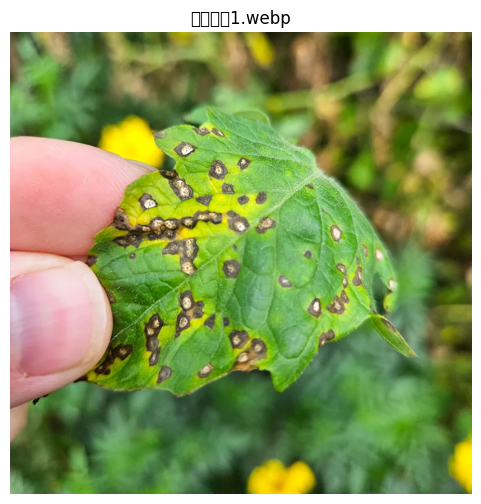

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아1.webp
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0017
2위: Tomato___Early_blight / 신뢰도: 0.0008
3위: Tomato___Target_Spot / 신뢰도: 0.0000
4위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
5위: Tomato___Leaf_Mold / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Tomato_mosaic_virus / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.0017
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.0000
신뢰도 차이         : -0.0017


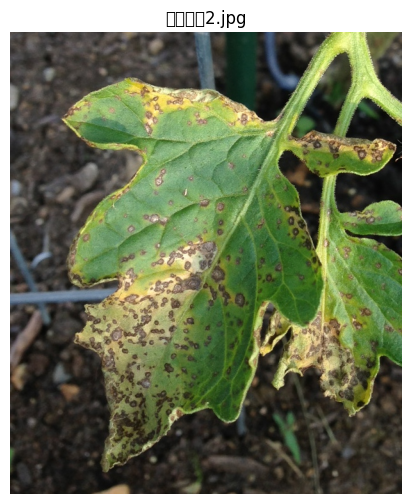

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0157
2위: Tomato___healthy / 신뢰도: 0.0015
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0004
4위: Tomato___Leaf_Mold / 신뢰도: 0.0001
5위: Tomato___Late_blight / 신뢰도: 0.0000
최종: 판단 어려움 (0.02)

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.0157
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.0000
신뢰도 차이         : -0.0157


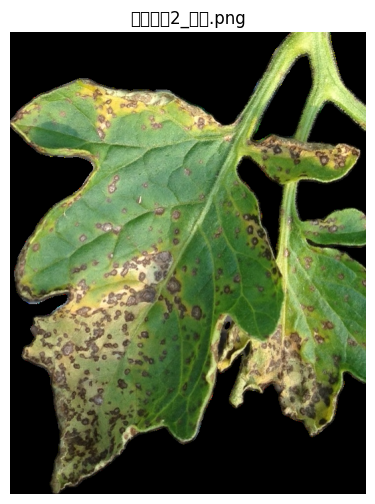

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0067
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0053
3위: Tomato___Late_blight / 신뢰도: 0.0001
4위: Tomato___Tomato_mosaic_virus / 신뢰도: 0.0000
5위: Tomato___Leaf_Mold / 신뢰도: 0.0000
최종: 판단 어려움 (0.01)

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0410
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0293
3위: Tomato___Target_Spot / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Bacterial_spot / 신뢰도: 0.0000
최종: 판단 어려움 (0.04)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.0067
ConvNeXt Tiny Top1  : Tomato___Early_blight / 0.0410
신뢰도 차이         : +0.0344


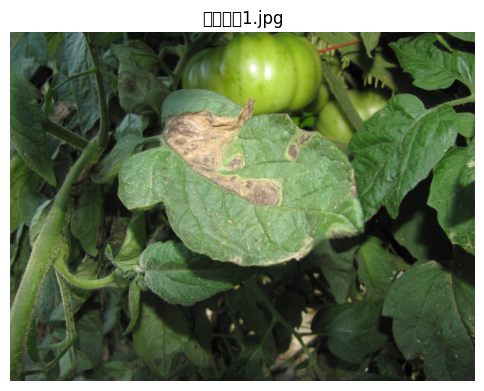

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병1.jpg
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.6939
2위: Tomato___Early_blight / 신뢰도: 0.0082
3위: Tomato___Target_Spot / 신뢰도: 0.0019
4위: Tomato___Leaf_Mold / 신뢰도: 0.0003
5위: Tomato___healthy / 신뢰도: 0.0002
최종: 판단 어려움 (0.69)

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0000
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___healthy / 신뢰도: 0.0000
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.6939
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.0000
신뢰도 차이         : -0.6939


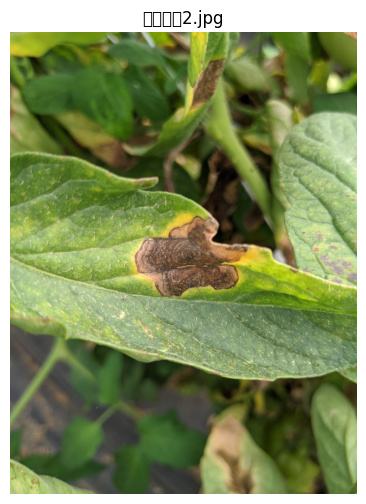

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병2.jpg
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Early_blight / 신뢰도: 0.7421
2위: Tomato___Late_blight / 신뢰도: 0.0237
3위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
4위: Tomato___Leaf_Mold / 신뢰도: 0.0000
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
최종: Tomato___Early_blight

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0000
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
4위: Tomato___healthy / 신뢰도: 0.0000
5위: Tomato___Bacterial_spot / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.7421
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.0000
신뢰도 차이         : -0.7420


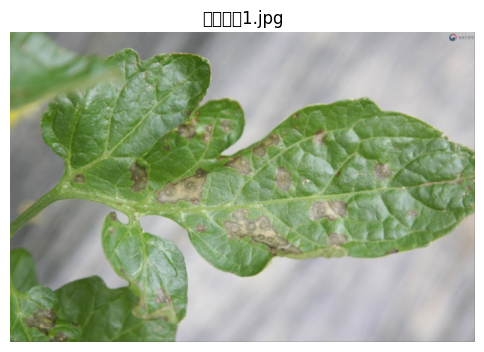

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0174
2위: Tomato___Early_blight / 신뢰도: 0.0133
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0013
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0004
5위: Tomato___Leaf_Mold / 신뢰도: 0.0002
최종: 판단 어려움 (0.02)

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Target_Spot / 신뢰도: 0.0001
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Late_blight / 신뢰도: 0.0000
4위: Tomato___healthy / 신뢰도: 0.0000
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.0174
ConvNeXt Tiny Top1  : Tomato___Target_Spot / 0.0001
신뢰도 차이         : -0.0173


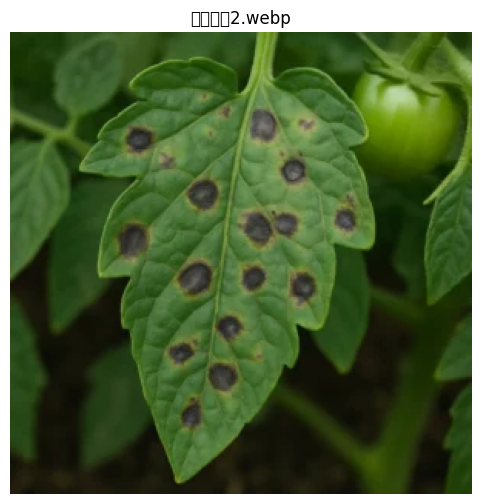

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병2.webp
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9360
2위: Tomato___Early_blight / 신뢰도: 0.0061
3위: Tomato___healthy / 신뢰도: 0.0001
4위: Tomato___Target_Spot / 신뢰도: 0.0001
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
최종: Tomato___Late_blight

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0446
2위: Tomato___Early_blight / 신뢰도: 0.0139
3위: Tomato___healthy / 신뢰도: 0.0005
4위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: 판단 어려움 (0.04)

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.9360
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.0446
신뢰도 차이         : -0.8914


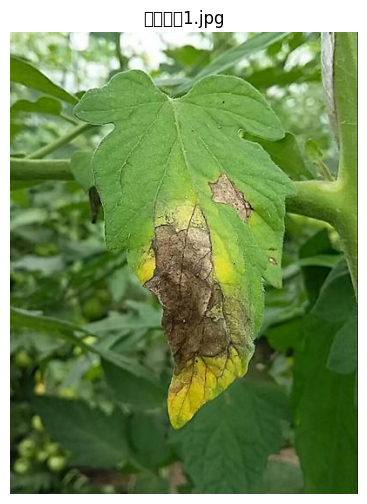

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병1.jpg
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 1.0000
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
4위: Tomato___Leaf_Mold / 신뢰도: 0.0000
5위: Tomato___Bacterial_spot / 신뢰도: 0.0000
최종: Tomato___Late_blight

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0072
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
4위: Tomato___Target_Spot / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.01)

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 1.0000
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.0072
신뢰도 차이         : -0.9928


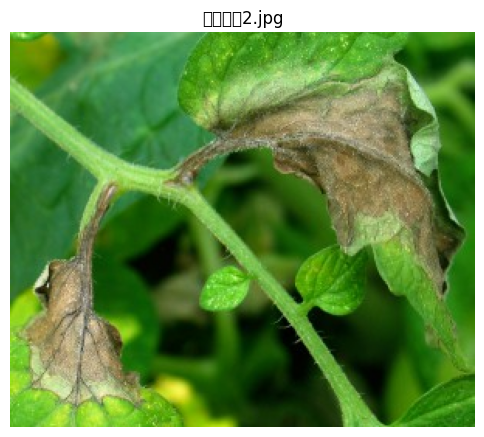

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병2.jpg
선택 작물: Tomato

[EfficientNetB0 Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9969
2위: Tomato___Target_Spot / 신뢰도: 0.0000
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Leaf_Mold / 신뢰도: 0.0000
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
최종: Tomato___Late_blight

[ConvNeXt Tiny Fine 결과]
1위: Tomato___Late_blight / 신뢰도: 0.0956
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Bacterial_spot / 신뢰도: 0.0000
최종: 판단 어려움 (0.10)

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.9969
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.0956
신뢰도 차이         : -0.9013


In [34]:
# =========================================================
# 테스트 이미지 실행
# =========================================================

test_images = [
    "/home/harry/Re_leaf_Project/Test_image/셉토리아1.webp",
    "/home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg",
    "/home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png",
    "/home/harry/Re_leaf_Project/Test_image/전기역병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/전기역병2.jpg",
    "/home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/점무늬병2.webp",
    "/home/harry/Re_leaf_Project/Test_image/후기역병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/후기역병2.jpg",
]

for img_path in test_images:
    compare_effb0_vs_convnext(
        img_path,
        selected_crop="Tomato",
        threshold=0.7
    )

In [46]:
# =========================================================
# 1. 38클래스 기준 라벨 매핑 Dataset
# =========================================================

class TomatoReal38MappedDataset(Dataset):
    def __init__(self, root_dir, class_names, transform=None):
        self.root_dir = root_dir
        self.class_names = class_names
        self.class_to_idx = {name: idx for idx, name in enumerate(class_names)}
        self.transform = transform
        self.samples = []

        for class_name in os.listdir(root_dir):
            class_dir = os.path.join(root_dir, class_name)

            if not os.path.isdir(class_dir):
                continue

            if class_name not in self.class_to_idx:
                print("38클래스에 없는 폴더라 제외:", class_name)
                continue

            label_idx = self.class_to_idx[class_name]

            for fname in os.listdir(class_dir):
                if fname.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
                    img_path = os.path.join(class_dir, fname)
                    self.samples.append((img_path, label_idx))

        print("추가학습 이미지 수:", len(self.samples))

        # 매핑 확인용 출력
        print("\n라벨 매핑 확인")
        for class_name in sorted(os.listdir(root_dir)):
            if class_name in self.class_to_idx:
                print(class_name, "→", self.class_to_idx[class_name])

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label_idx = self.samples[idx]

        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img = self.transform(img)

        return img, label_idx

In [48]:
import os

print(os.listdir("/home/harry/Re_leaf_Project/tomato_real_38cls"))

['Tomato__Septoria_leaf_spot', 'Tomato__Bacterial_spot', 'Tomato__Early_blight', 'Tomato__Late_blight']


In [49]:
# =========================================================
# 2. 클래스 로드 + 데이터셋 생성
# =========================================================

with open(CLASS_PATH, "r", encoding="utf-8") as f:
    class_38 = json.load(f)

tomato_real_ds = TomatoReal38MappedDataset(
    root_dir=TOMATO_REAL_DIR,
    class_names=class_38,
    transform=train_transform
)

tomato_real_loader = DataLoader(
    tomato_real_ds,
    batch_size=BATCH_SIZE,
    shuffle=True
)

추가학습 이미지 수: 406

라벨 매핑 확인
Tomato___Bacterial_spot → 28
Tomato___Early_blight → 29
Tomato___Late_blight → 30
Tomato___Septoria_leaf_spot → 32


In [52]:
for f in os.listdir():
    if f.endswith(".pth"):
        print(f)

model_reaf_ai_effb0_38cls_extra406_preprocessed_finetuned.pth
model_reaf_ai_effb0_38cls_finetuned.pth
model_reaf_ai_effb0_15cls_finetuned.pth
cp_15cls_extra_finetuned.pth
cp_38cls_finetuned.pth
model_convnext_tiny_38cls_stage1.pth
model_reaf_ai_effb0_38cls_extra406_finetuned.pth
cp_15cls_stage1.pth
model_reaf_ai_effb0_38cls_stage1.pth
model_reaf_ai_effb0_15cls_stage1.pth
cp_convnext_tiny_38cls_finetuned.pth
cp_15cls_finetuned.pth
cp_convnext_tiny_38cls_stage1.pth
model_convnext_tiny_38cls_finetuned.pth
cp_38cls_extra_finetuned.pth
model_reaf_ai_effb0_15cls_extra406_finetuned.pth
cp_38cls_stage1.pth


In [54]:
# =========================================================
# 3. ConvNeXt 38cls fine 모델 로드
# =========================================================
CLASS_PATH = "class_names_38cls.json"
BASE_MODEL_PATH = "model_convnext_tiny_38cls_finetuned.pth"

model_convnext_extra406 = create_convnext_tiny(len(class_38))

model_convnext_extra406.load_state_dict(
    torch.load(BASE_MODEL_PATH, map_location=DEVICE)
)

model_convnext_extra406.to(DEVICE)

print("ConvNeXt 38cls fine 모델 로드 완료")

ConvNeXt 38cls fine 모델 로드 완료


/tmp/ipykernel_1838/3309409138.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(BASE_MODEL_PATH, map_location=DEVICE)


In [55]:
# =========================================================
# 4. 추가학습 설정
# =========================================================

# 전체 freeze
for p in model_convnext_extra406.parameters():
    p.requires_grad = False

# classifier 학습
for p in model_convnext_extra406.classifier.parameters():
    p.requires_grad = True

# ConvNeXt features 뒤쪽 20개 leaf module 학습
leaf_modules = []

for name, module in model_convnext_extra406.features.named_modules():
    if len(list(module.children())) == 0:
        leaf_modules.append((name, module))

print("leaf module 개수:", len(leaf_modules))

for name, module in leaf_modules[-20:]:
    for p in module.parameters():
        p.requires_grad = True

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model_convnext_extra406.parameters()),
    lr=1e-5
)

EPOCHS_EXTRA = 5

leaf module 개수: 152


In [56]:
# =========================================================
# 5. Extra406 추가학습 실행
# =========================================================

best_acc = 0.0

for epoch in range(EPOCHS_EXTRA):
    train_loss, train_acc = train_one_epoch(
        model_convnext_extra406,
        tomato_real_loader,
        criterion,
        optimizer
    )

    print(
        f"[ConvNeXt 38cls Extra406 {epoch+1}/{EPOCHS_EXTRA}] "
        f"loss:{train_loss:.4f} acc:{train_acc:.4f}"
    )

    if train_acc > best_acc:
        best_acc = train_acc
        torch.save(
            model_convnext_extra406.state_dict(),
            "cp_convnext_tiny_38cls_extra406_finetuned.pth"
        )
        print("체크포인트 저장 완료")

torch.save(
    model_convnext_extra406.state_dict(),
    "model_convnext_tiny_38cls_extra406_finetuned.pth"
)

print("ConvNeXt 38cls Extra406 최종 모델 저장 완료")

[ConvNeXt 38cls Extra406 1/5] loss:16.9540 acc:0.0074
체크포인트 저장 완료
[ConvNeXt 38cls Extra406 2/5] loss:14.2901 acc:0.0148
체크포인트 저장 완료
[ConvNeXt 38cls Extra406 3/5] loss:12.4155 acc:0.0369
체크포인트 저장 완료
[ConvNeXt 38cls Extra406 4/5] loss:10.8478 acc:0.0764
체크포인트 저장 완료
[ConvNeXt 38cls Extra406 5/5] loss:9.2476 acc:0.1232
체크포인트 저장 완료
ConvNeXt 38cls Extra406 최종 모델 저장 완료


In [57]:
# -------------------------
# 모델 로드
# -------------------------
model_effb0_fine_extra406 = load_effb0_model(
    "model_reaf_ai_effb0_38cls_extra406_finetuned.pth",
    num_classes
)

model_convnext_fine_extra406 = load_convnext_model(
    "model_convnext_tiny_38cls_extra406_finetuned.pth",
    num_classes
)

print("모델 로드 완료")

/tmp/ipykernel_1838/1005607494.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(weight_path, map_location=DEVICE))


모델 로드 완료


/tmp/ipykernel_1838/3183091294.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(weight_path, map_location=DEVICE)


In [58]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_effb0_fine_extra406 = model_effb0_fine_extra406.to(device)
model_convnext_fine_extra406 = model_convnext_fine_extra406.to(device)

model_effb0_fine_extra406.eval()
model_convnext_fine_extra406.eval()

ConvNeXt(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
    )
    (1): Sequential(
      (0): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=96, out_features=384, bias=True)
          (4): GELU(approximate='none')
          (5): Linear(in_features=384, out_features=96, bias=True)
          (6): Permute()
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=

In [61]:
# =========================================================
# 이미지 1장 기준 두 모델 비교
# =========================================================

def compare_effb0_vs_convnext(img_path, selected_crop="Tomato", threshold=0.7):
    img = Image.open(img_path).convert("RGB")

    eff_results = get_crop_filtered_topk(
        model_effb0_fine_extra406,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    conv_results = get_crop_filtered_topk(
        model_convnext_fine_extra406,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis("off")
    plt.show()

    print("=" * 80)
    print("이미지:", img_path)
    print("선택 작물:", selected_crop)
    print("=" * 80)

    print("\n[EfficientNetB0 Fine extra406 결과]")
    for i, (name, conf) in enumerate(eff_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    eff_top, eff_conf = eff_results[0]
    print("최종:", eff_top if eff_conf >= threshold else f"판단 어려움 ({eff_conf:.2f})")

    print("\n[ConvNeXt Tiny Fine extra406 결과]")
    for i, (name, conf) in enumerate(conv_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    conv_top, conv_conf = conv_results[0]
    print("최종:", conv_top if conv_conf >= threshold else f"판단 어려움 ({conv_conf:.2f})")

    print("\n[비교]")
    print(f"EfficientNetB0 Top1 : {eff_top} / {eff_conf:.4f}")
    print(f"ConvNeXt Tiny Top1  : {conv_top} / {conv_conf:.4f}")
    print(f"신뢰도 차이         : {conv_conf - eff_conf:+.4f}")

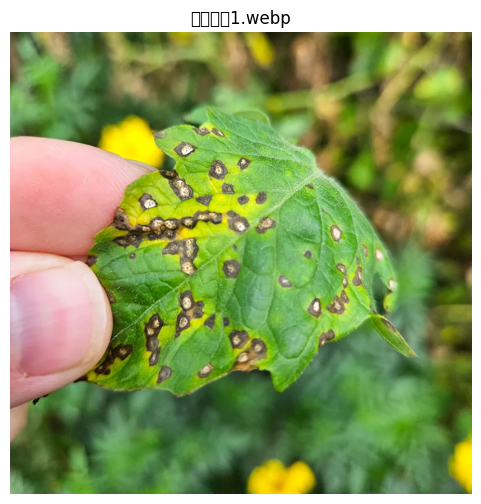

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아1.webp
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Bacterial_spot / 신뢰도: 0.0311
2위: Tomato___Target_Spot / 신뢰도: 0.0055
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0018
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0009
5위: Tomato___Early_blight / 신뢰도: 0.0007
최종: 판단 어려움 (0.03)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.7902
2위: Tomato___Early_blight / 신뢰도: 0.0013
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Tomato_mosaic_virus / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
EfficientNetB0 Top1 : Tomato___Bacterial_spot / 0.0311
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.7902
신뢰도 차이         : +0.7591


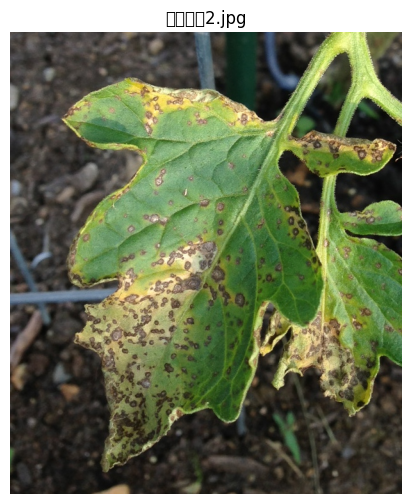

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___healthy / 신뢰도: 0.0583
2위: Tomato___Early_blight / 신뢰도: 0.0120
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0074
4위: Tomato___Target_Spot / 신뢰도: 0.0032
5위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0004
최종: 판단 어려움 (0.06)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9890
2위: Tomato___Early_blight / 신뢰도: 0.0018
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
EfficientNetB0 Top1 : Tomato___healthy / 0.0583
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.9890
신뢰도 차이         : +0.9307


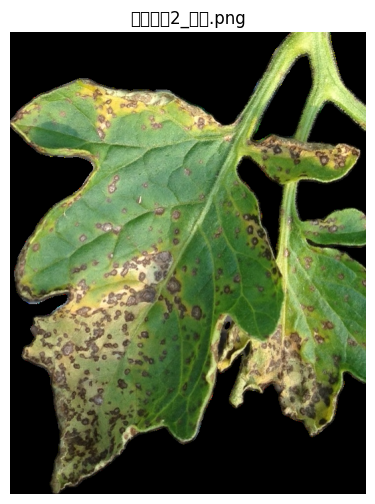

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___healthy / 신뢰도: 0.1050
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0588
3위: Tomato___Early_blight / 신뢰도: 0.0272
4위: Tomato___Late_blight / 신뢰도: 0.0158
5위: Tomato___Target_Spot / 신뢰도: 0.0034
최종: 판단 어려움 (0.10)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9975
2위: Tomato___Early_blight / 신뢰도: 0.0025
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Target_Spot / 신뢰도: 0.0000
5위: Tomato___Late_blight / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
EfficientNetB0 Top1 : Tomato___healthy / 0.1050
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.9975
신뢰도 차이         : +0.8925


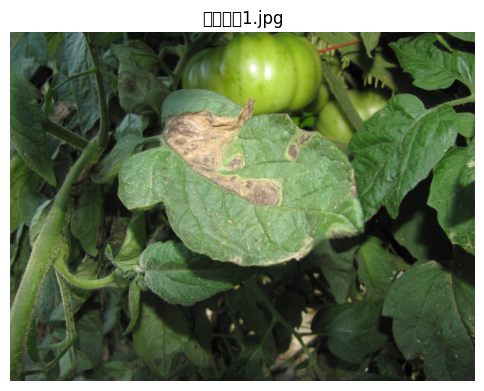

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병1.jpg
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.1978
2위: Tomato___Late_blight / 신뢰도: 0.1279
3위: Tomato___Target_Spot / 신뢰도: 0.0911
4위: Tomato___Bacterial_spot / 신뢰도: 0.0100
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0094
최종: 판단 어려움 (0.20)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0012
2위: Tomato___Late_blight / 신뢰도: 0.0011
3위: Tomato___Early_blight / 신뢰도: 0.0005
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.1978
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.0012
신뢰도 차이         : -0.1966


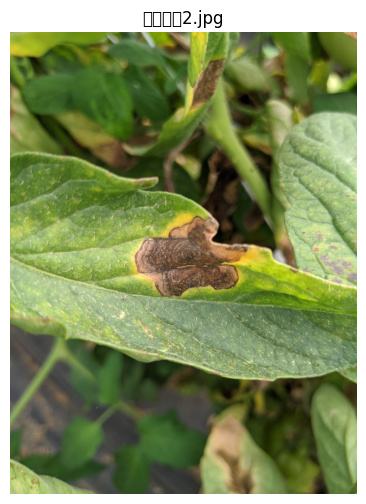

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병2.jpg
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.9580
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0128
3위: Tomato___Late_blight / 신뢰도: 0.0017
4위: Tomato___Target_Spot / 신뢰도: 0.0014
5위: Tomato___Bacterial_spot / 신뢰도: 0.0012
최종: Tomato___Early_blight

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0110
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0018
3위: Tomato___Late_blight / 신뢰도: 0.0011
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.01)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.9580
ConvNeXt Tiny Top1  : Tomato___Early_blight / 0.0110
신뢰도 차이         : -0.9470


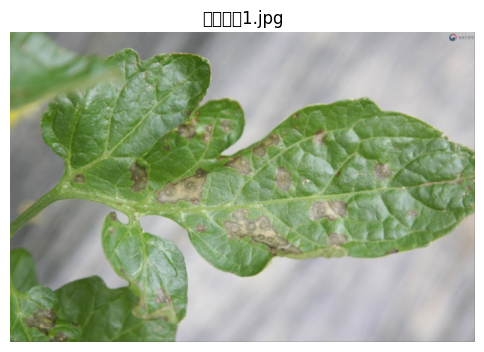

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0025
2위: Tomato___Late_blight / 신뢰도: 0.0010
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
4위: Tomato___healthy / 신뢰도: 0.0000
5위: Tomato___Leaf_Mold / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0119
2위: Tomato___Target_Spot / 신뢰도: 0.0017
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0002
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.01)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.0025
ConvNeXt Tiny Top1  : Tomato___Early_blight / 0.0119
신뢰도 차이         : +0.0094


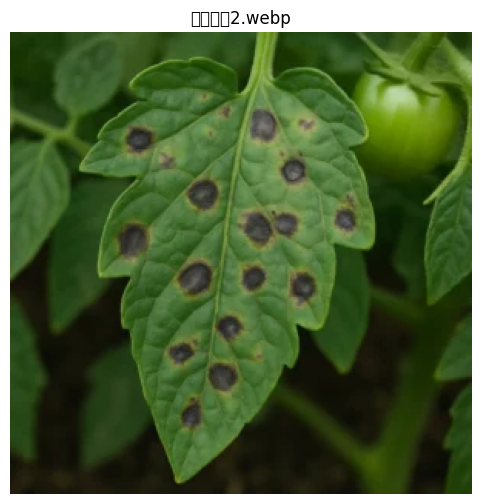

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병2.webp
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.6601
2위: Tomato___Late_blight / 신뢰도: 0.2043
3위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0095
4위: Tomato___Target_Spot / 신뢰도: 0.0075
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0008
최종: 판단 어려움 (0.66)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.6776
2위: Tomato___Early_blight / 신뢰도: 0.2849
3위: Tomato___healthy / 신뢰도: 0.0054
4위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0008
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: 판단 어려움 (0.68)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.6601
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.6776
신뢰도 차이         : +0.0174


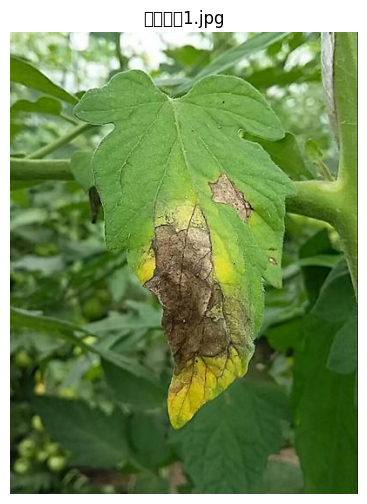

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병1.jpg
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9395
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0022
3위: Tomato___Early_blight / 신뢰도: 0.0001
4위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0001
5위: Tomato___Leaf_Mold / 신뢰도: 0.0001
최종: Tomato___Late_blight

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9844
2위: Tomato___Early_blight / 신뢰도: 0.0035
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0004
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.9395
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.9844
신뢰도 차이         : +0.0449


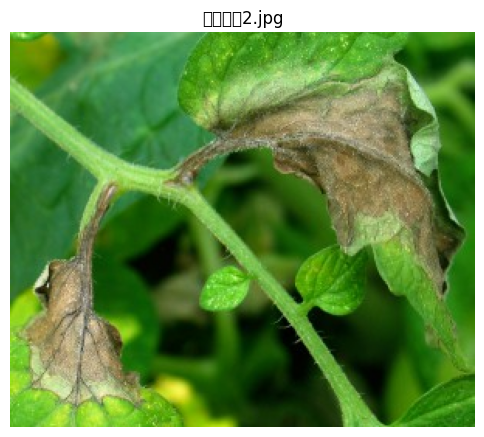

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병2.jpg
선택 작물: Tomato

[EfficientNetB0 Fine extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.2928
2위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0003
3위: Tomato___Target_Spot / 신뢰도: 0.0001
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Early_blight / 신뢰도: 0.0000
최종: 판단 어려움 (0.29)

[ConvNeXt Tiny Fine extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9514
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.2928
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.9514
신뢰도 차이         : +0.6586


In [62]:
# =========================================================
# 테스트 이미지 실행
# =========================================================

test_images = [
    "/home/harry/Re_leaf_Project/Test_image/셉토리아1.webp",
    "/home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg",
    "/home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png",
    "/home/harry/Re_leaf_Project/Test_image/전기역병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/전기역병2.jpg",
    "/home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/점무늬병2.webp",
    "/home/harry/Re_leaf_Project/Test_image/후기역병1.jpg",
    "/home/harry/Re_leaf_Project/Test_image/후기역병2.jpg",
]

for img_path in test_images:
    compare_effb0_vs_convnext(
        img_path,
        selected_crop="Tomato",
        threshold=0.7
    )

In [63]:
# =========================================================
# crop 필터링 + 작물 내부 확률 재정규화 Top-K 함수
# =========================================================

def get_crop_filtered_topk_normalized(
    model,
    class_names,
    img,
    selected_crop="Tomato",
    topk=5
):
    model.eval()

    # 이미지 전처리
    x = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(x)
        probs = torch.softmax(outputs, dim=1)[0]

    # 선택 작물에 해당하는 클래스 인덱스만 추출
    crop_indices = [
        i for i, name in enumerate(class_names)
        if name.startswith(selected_crop + "___")
    ]

    if len(crop_indices) == 0:
        raise ValueError(f"{selected_crop}에 해당하는 클래스가 없습니다.")

    # 전체 38클래스 확률 중 선택 작물 클래스만 추출
    crop_probs = probs[crop_indices]

    # 핵심: 선택 작물 내부에서 다시 정규화
    crop_probs = crop_probs / crop_probs.sum()

    # crop 내부 기준 top-k
    top_probs, top_pos = torch.topk(
        crop_probs,
        k=min(topk, len(crop_indices))
    )

    results = []

    for prob, pos in zip(top_probs, top_pos):
        original_idx = crop_indices[pos.item()]
        class_name = class_names[original_idx]
        results.append((class_name, prob.item()))

    return results

In [64]:
# =========================================================
# 이미지 1장 기준 두 모델 비교 - crop 내부 정규화 버전
# =========================================================

def compare_effb0_vs_convnext_normalized(img_path, selected_crop="Tomato", threshold=0.7):
    img = Image.open(img_path).convert("RGB")

    eff_results = get_crop_filtered_topk_normalized(
        model_effb0_fine_extra406,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    conv_results = get_crop_filtered_topk_normalized(
        model_convnext_fine_extra406,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis("off")
    plt.show()

    print("=" * 80)
    print("이미지:", img_path)
    print("선택 작물:", selected_crop)
    print("※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.")
    print("=" * 80)

    print("\n[EfficientNetB0 Fine extra406 결과 - crop normalized]")
    for i, (name, conf) in enumerate(eff_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    eff_top, eff_conf = eff_results[0]
    print("최종:", eff_top if eff_conf >= threshold else f"판단 어려움 ({eff_conf:.2f})")

    print("\n[ConvNeXt Tiny Fine extra406 결과 - crop normalized]")
    for i, (name, conf) in enumerate(conv_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    conv_top, conv_conf = conv_results[0]
    print("최종:", conv_top if conv_conf >= threshold else f"판단 어려움 ({conv_conf:.2f})")

    print("\n[비교]")
    print(f"EfficientNetB0 Top1 : {eff_top} / {eff_conf:.4f}")
    print(f"ConvNeXt Tiny Top1  : {conv_top} / {conv_conf:.4f}")
    print(f"신뢰도 차이         : {conv_conf - eff_conf:+.4f}")

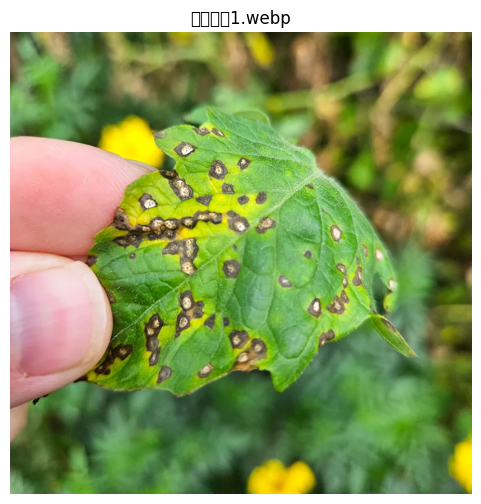

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아1.webp
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Bacterial_spot / 신뢰도: 0.7633
2위: Tomato___Target_Spot / 신뢰도: 0.1354
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0441
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0226
5위: Tomato___Early_blight / 신뢰도: 0.0178
최종: Tomato___Bacterial_spot

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9983
2위: Tomato___Early_blight / 신뢰도: 0.0017
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Tomato_mosaic_virus / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
EfficientNetB0 Top1 : Tomato___Bacterial_spot / 0.7633
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.9983
신뢰도 차이         : +0.2350


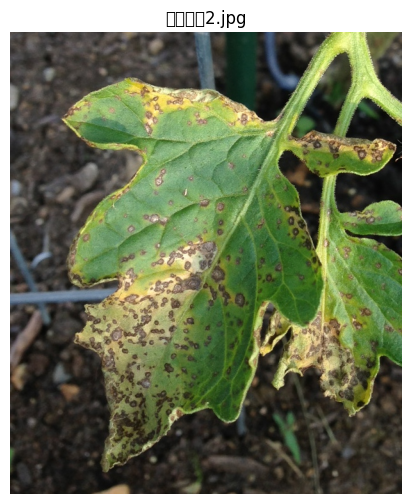

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___healthy / 신뢰도: 0.7111
2위: Tomato___Early_blight / 신뢰도: 0.1467
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0906
4위: Tomato___Target_Spot / 신뢰도: 0.0389
5위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0051
최종: Tomato___healthy

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9982
2위: Tomato___Early_blight / 신뢰도: 0.0018
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
EfficientNetB0 Top1 : Tomato___healthy / 0.7111
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.9982
신뢰도 차이         : +0.2871


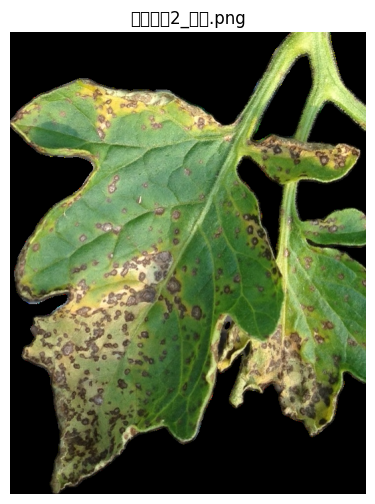

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___healthy / 신뢰도: 0.4988
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.2792
3위: Tomato___Early_blight / 신뢰도: 0.1293
4위: Tomato___Late_blight / 신뢰도: 0.0752
5위: Tomato___Target_Spot / 신뢰도: 0.0162
최종: 판단 어려움 (0.50)

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9975
2위: Tomato___Early_blight / 신뢰도: 0.0025
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Target_Spot / 신뢰도: 0.0000
5위: Tomato___Late_blight / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
EfficientNetB0 Top1 : Tomato___healthy / 0.4988
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.9975
신뢰도 차이         : +0.4988


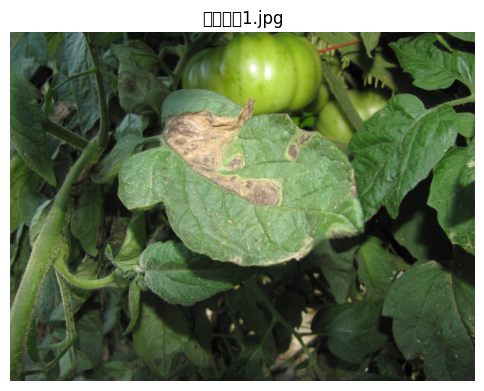

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병1.jpg
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Early_blight / 신뢰도: 0.4467
2위: Tomato___Late_blight / 신뢰도: 0.2888
3위: Tomato___Target_Spot / 신뢰도: 0.2059
4위: Tomato___Bacterial_spot / 신뢰도: 0.0227
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0212
최종: 판단 어려움 (0.45)

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.4156
2위: Tomato___Late_blight / 신뢰도: 0.3843
3위: Tomato___Early_blight / 신뢰도: 0.1808
4위: Tomato___Bacterial_spot / 신뢰도: 0.0139
5위: Tomato___healthy / 신뢰도: 0.0052
최종: 판단 어려움 (0.42)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.4467
ConvNeXt Tiny Top1  : Tomato___Septoria_leaf_spot / 0.4156
신뢰도 차이         : -0.0311


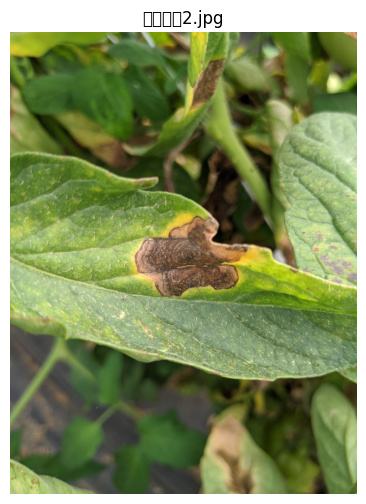

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병2.jpg
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Early_blight / 신뢰도: 0.9819
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0132
3위: Tomato___Late_blight / 신뢰도: 0.0017
4위: Tomato___Target_Spot / 신뢰도: 0.0014
5위: Tomato___Bacterial_spot / 신뢰도: 0.0012
최종: Tomato___Early_blight

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Early_blight / 신뢰도: 0.7910
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.1268
3위: Tomato___Late_blight / 신뢰도: 0.0820
4위: Tomato___Bacterial_spot / 신뢰도: 0.0001
5위: Tomato___healthy / 신뢰도: 0.0000
최종: Tomato___Early_blight

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.9819
ConvNeXt Tiny Top1  : Tomato___Early_blight / 0.7910
신뢰도 차이         : -0.1909


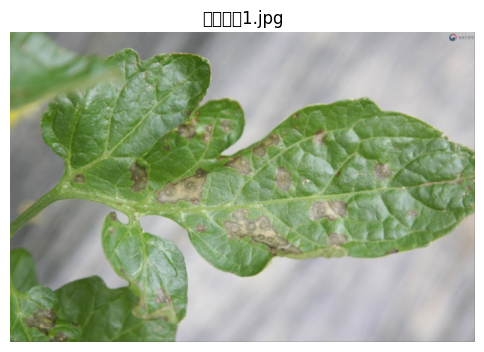

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Early_blight / 신뢰도: 0.7154
2위: Tomato___Late_blight / 신뢰도: 0.2719
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0088
4위: Tomato___healthy / 신뢰도: 0.0019
5위: Tomato___Leaf_Mold / 신뢰도: 0.0008
최종: Tomato___Early_blight

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Early_blight / 신뢰도: 0.8631
2위: Tomato___Target_Spot / 신뢰도: 0.1236
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0111
4위: Tomato___Late_blight / 신뢰도: 0.0016
5위: Tomato___healthy / 신뢰도: 0.0005
최종: Tomato___Early_blight

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.7154
ConvNeXt Tiny Top1  : Tomato___Early_blight / 0.8631
신뢰도 차이         : +0.1477


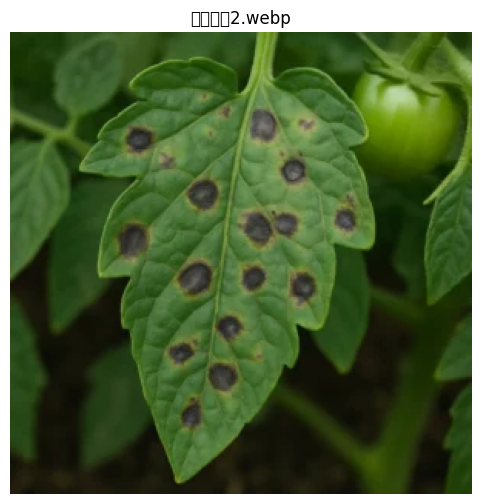

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병2.webp
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Early_blight / 신뢰도: 0.7479
2위: Tomato___Late_blight / 신뢰도: 0.2315
3위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0107
4위: Tomato___Target_Spot / 신뢰도: 0.0085
5위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0009
최종: Tomato___Early_blight

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Late_blight / 신뢰도: 0.6995
2위: Tomato___Early_blight / 신뢰도: 0.2941
3위: Tomato___healthy / 신뢰도: 0.0055
4위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0009
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: 판단 어려움 (0.70)

[비교]
EfficientNetB0 Top1 : Tomato___Early_blight / 0.7479
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.6995
신뢰도 차이         : -0.0484


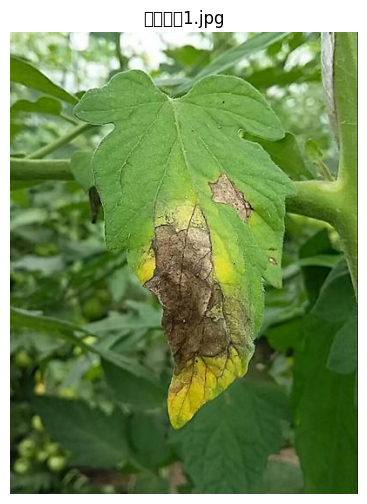

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병1.jpg
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Late_blight / 신뢰도: 0.9973
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0023
3위: Tomato___Early_blight / 신뢰도: 0.0002
4위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0001
5위: Tomato___Leaf_Mold / 신뢰도: 0.0001
최종: Tomato___Late_blight

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Late_blight / 신뢰도: 0.9961
2위: Tomato___Early_blight / 신뢰도: 0.0035
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0004
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.9973
ConvNeXt Tiny Top1  : Tomato___Late_blight / 0.9961
신뢰도 차이         : -0.0012


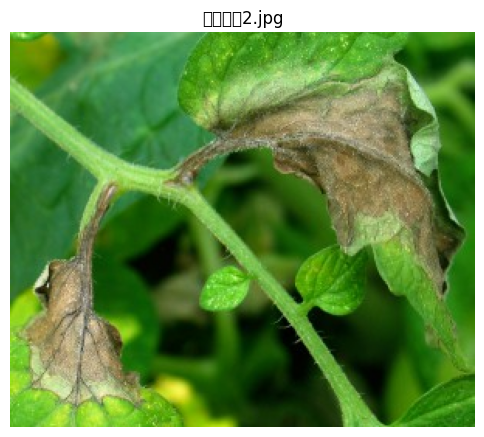

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병2.jpg
선택 작물: Tomato
※ 신뢰도는 선택 작물 내부에서 재정규화된 확률입니다.

[EfficientNetB0 Fine extra406 결과 - crop normalized]
1위: Tomato___Late_blight / 신뢰도: 0.9987
2위: Tomato___Spider_mites Two-spotted_spider_mite / 신뢰도: 0.0010
3위: Tomato___Target_Spot / 신뢰도: 0.0002
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0001
5위: Tomato___Early_blight / 신뢰도: 0.0000
최종: Tomato___Late_blight

[ConvNeXt Tiny Fine extra406 결과 - crop normalized]
1위: Tomato___Late_blight / 신뢰도: 1.0000
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
EfficientNetB0 Top1 : Tomato___Late_blight / 0.9987
ConvNeXt Tiny Top1  : Tomato___Late_blight / 1.0000
신뢰도 차이         : +0.0013


In [67]:
# =========================================================
# 테스트 이미지 실행 - crop 내부 정규화 버전
# =========================================================

for img_path in test_images:
    compare_effb0_vs_convnext_normalized(
        img_path,
        selected_crop="Tomato",
        threshold=0.7
    )

In [68]:
# =========================================================
# 0. 기본 설정
# =========================================================

import os
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("사용 device:", device)


# =========================================================
# 1. 경로 설정
# =========================================================

# 기존 PlantVillage 38cls fine-tuned ConvNeXt 모델
BASE_CONVNEXT_MODEL_PATH = "model_convnext_tiny_38cls_finetuned.pth"

# 전처리된 tomato real 4클래스 이미지 폴더
TOMATO_PREPROCESSED_DIR = "/home/harry/Re_leaf_Project/tomato_real_38cls_preprocessed"

# 저장 파일명
SAVE_CP_PATH = "cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth"
SAVE_MODEL_PATH = "model_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth"


# =========================================================
# 2. 학습 설정
# =========================================================

BATCH_SIZE = 16
EPOCHS_EXTRA = 10
LR_EXTRA = 1e-5

criterion = nn.CrossEntropyLoss()

사용 device: cuda


In [69]:
# =========================================================
# 3. ConvNeXt 전처리 transform
# =========================================================

convnext_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [70]:
# =========================================================
# 4. Tomato real 전처리 데이터셋 클래스
#    - 폴더명은 4개 클래스
#    - 라벨은 class_38 기준 인덱스로 매핑
# =========================================================

class TomatoPreprocessedDataset(Dataset):
    def __init__(self, root_dir, class_38, transform=None):
        self.root_dir = root_dir
        self.class_38 = class_38
        self.transform = transform
        self.samples = []

        # 폴더명이 조금 달라도 대응하기 위한 매핑
        label_map = {
            "Tomato__Bacterial_spot": "Tomato___Bacterial_spot",
            "Tomato___Bacterial_spot": "Tomato___Bacterial_spot",

            "Tomato__Early_blight": "Tomato___Early_blight",
            "Tomato___Early_blight": "Tomato___Early_blight",

            "Tomato__Late_blight": "Tomato___Late_blight",
            "Tomato___Late_blight": "Tomato___Late_blight",

            "Tomato__Septoria_leaf_spot": "Tomato___Septoria_leaf_spot",
            "Tomato___Septoria_leaf_spot": "Tomato___Septoria_leaf_spot",
        }

        for folder_name in os.listdir(root_dir):
            folder_path = os.path.join(root_dir, folder_name)

            if not os.path.isdir(folder_path):
                continue

            if folder_name not in label_map:
                print("매핑 제외 폴더:", folder_name)
                continue

            target_class_name = label_map[folder_name]
            target_idx = class_38.index(target_class_name)

            for file_name in os.listdir(folder_path):
                if file_name.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
                    img_path = os.path.join(folder_path, file_name)
                    self.samples.append((img_path, target_idx))

        print("전처리 tomato 추가학습 이미지 수:", len(self.samples))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]

        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img = self.transform(img)

        return img, label

In [71]:
# =========================================================
# 5. 전처리 tomato real DataLoader 생성
# =========================================================

tomato_preprocessed_dataset = TomatoPreprocessedDataset(
    root_dir=TOMATO_PREPROCESSED_DIR,
    class_38=class_38,
    transform=convnext_transform
)

tomato_preprocessed_loader = DataLoader(
    tomato_preprocessed_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

전처리 tomato 추가학습 이미지 수: 406


In [72]:
# =========================================================
# 6. ConvNeXt 모델 로드
#    - 기존 38cls fine 모델을 불러온 뒤
#    - 전처리 tomato 이미지로 추가학습
# =========================================================

model_convnext_preprocessed_extra406 = load_convnext_model(
    BASE_CONVNEXT_MODEL_PATH,
    num_classes=len(class_38)
)

model_convnext_preprocessed_extra406 = model_convnext_preprocessed_extra406.to(device)

print("ConvNeXt 38cls fine 모델 로드 완료")

ConvNeXt 38cls fine 모델 로드 완료


/tmp/ipykernel_1838/3183091294.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(weight_path, map_location=DEVICE)


In [73]:
# =========================================================
# 7. 추가학습 설정
#    - 전체 freeze
#    - classifier 학습
#    - features 뒤쪽 일부 leaf module만 학습
# =========================================================

# 전체 freeze
for p in model_convnext_preprocessed_extra406.parameters():
    p.requires_grad = False

# classifier 학습
for p in model_convnext_preprocessed_extra406.classifier.parameters():
    p.requires_grad = True

# features 뒤쪽 leaf module 일부 학습
leaf_modules = []

for name, module in model_convnext_preprocessed_extra406.features.named_modules():
    if len(list(module.children())) == 0:
        leaf_modules.append((name, module))

print("leaf module 개수:", len(leaf_modules))

# 뒤쪽 20개 leaf module만 unfreeze
for name, module in leaf_modules[-20:]:
    for p in module.parameters():
        p.requires_grad = True

# optimizer 설정
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model_convnext_preprocessed_extra406.parameters()),
    lr=LR_EXTRA
)

leaf module 개수: 152


In [74]:
# =========================================================
# 8. 전처리 tomato real extra406 추가학습 실행
# =========================================================

best_acc = 0.0

for epoch in range(EPOCHS_EXTRA):
    train_loss, train_acc = train_one_epoch(
        model_convnext_preprocessed_extra406,
        tomato_preprocessed_loader,
        criterion,
        optimizer
    )

    print(
        f"[ConvNeXt 38cls Extra406 Preprocessed {epoch+1}/{EPOCHS_EXTRA}] "
        f"loss:{train_loss:.4f} acc:{train_acc:.4f}"
    )

    if train_acc > best_acc:
        best_acc = train_acc

        torch.save(
            model_convnext_preprocessed_extra406.state_dict(),
            SAVE_CP_PATH
        )

        print("체크포인트 저장 완료:", SAVE_CP_PATH)

torch.save(
    model_convnext_preprocessed_extra406.state_dict(),
    SAVE_MODEL_PATH
)

print("ConvNeXt 38cls Extra406 Preprocessed 최종 모델 저장 완료:", SAVE_MODEL_PATH)

[ConvNeXt 38cls Extra406 Preprocessed 1/10] loss:15.3029 acc:0.0025
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 Preprocessed 2/10] loss:11.2464 acc:0.0640
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 Preprocessed 3/10] loss:8.4909 acc:0.1576
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 Preprocessed 4/10] loss:6.0486 acc:0.2586
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 Preprocessed 5/10] loss:4.5063 acc:0.3793
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 Preprocessed 6/10] loss:3.4028 acc:0.4606
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 Preprocessed 7/10] loss:2.9460 acc:0.5099
체크포인트 저장 완료: cp_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth
[ConvNeXt 38cls Extra406 

In [75]:
# =========================================================
# 9. 일반 extra406 모델 vs 전처리 extra406 모델 로드
# =========================================================

model_convnext_extra406 = load_convnext_model(
    "model_convnext_tiny_38cls_extra406_finetuned.pth",
    num_classes=len(class_38)
)

model_convnext_preprocessed_extra406 = load_convnext_model(
    "model_convnext_tiny_38cls_extra406_preprocessed_finetuned.pth",
    num_classes=len(class_38)
)

model_convnext_extra406 = model_convnext_extra406.to(device)
model_convnext_preprocessed_extra406 = model_convnext_preprocessed_extra406.to(device)

model_convnext_extra406.eval()
model_convnext_preprocessed_extra406.eval()

print("일반 extra406 모델 / 전처리 extra406 모델 로드 완료")

/tmp/ipykernel_1838/3183091294.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(weight_path, map_location=DEVICE)


일반 extra406 모델 / 전처리 extra406 모델 로드 완료


In [76]:
# =========================================================
# 이미지 1장 기준 두 모델 비교
# - 일반 ConvNeXt extra406
# - 전처리 ConvNeXt extra406
# =========================================================

def compare_convnext_vs_convnext_pre(img_path, selected_crop="Tomato", threshold=0.7):
    img = Image.open(img_path).convert("RGB")

    # 일반 extra406 모델 결과
    conv_results = get_crop_filtered_topk(
        model_convnext_extra406,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    # 전처리 extra406 모델 결과
    conv_pre_results = get_crop_filtered_topk(
        model_convnext_preprocessed_extra406,
        class_38,
        img,
        selected_crop=selected_crop,
        topk=5
    )

    # 이미지 출력
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis("off")
    plt.show()

    print("=" * 80)
    print("이미지:", img_path)
    print("선택 작물:", selected_crop)
    print("=" * 80)

    # 일반 ConvNeXt 결과 출력
    print("\n[ConvNeXt Tiny extra406 결과]")
    for i, (name, conf) in enumerate(conv_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    conv_top, conv_conf = conv_results[0]
    print("최종:", conv_top if conv_conf >= threshold else f"판단 어려움 ({conv_conf:.2f})")

    # 전처리 ConvNeXt 결과 출력
    print("\n[ConvNeXt Tiny extra406 Preprocessed 결과]")
    for i, (name, conf) in enumerate(conv_pre_results, start=1):
        print(f"{i}위: {name} / 신뢰도: {conf:.4f}")

    conv_pre_top, conv_pre_conf = conv_pre_results[0]
    print("최종:", conv_pre_top if conv_pre_conf >= threshold else f"판단 어려움 ({conv_pre_conf:.2f})")

    # 비교 출력
    print("\n[비교]")
    print(f"ConvNeXt Tiny Top1              : {conv_top} / {conv_conf:.4f}")
    print(f"ConvNeXt Tiny Preprocessed Top1 : {conv_pre_top} / {conv_pre_conf:.4f}")
    print(f"신뢰도 차이                     : {conv_pre_conf - conv_conf:+.4f}")

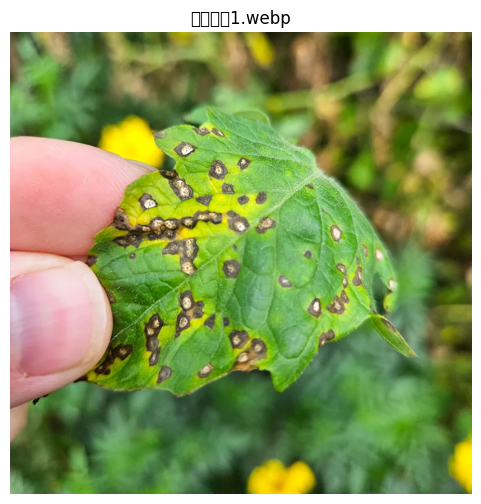

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아1.webp
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.7902
2위: Tomato___Early_blight / 신뢰도: 0.0013
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Tomato_mosaic_virus / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9997
2위: Tomato___Bacterial_spot / 신뢰도: 0.0003
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
5위: Tomato___Late_blight / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
ConvNeXt Tiny Top1              : Tomato___Septoria_leaf_spot / 0.7902
ConvNeXt Tiny Preprocessed Top1 : Tomato___Septoria_leaf_spot / 0.9997
신뢰도 차이                     : +0.2095


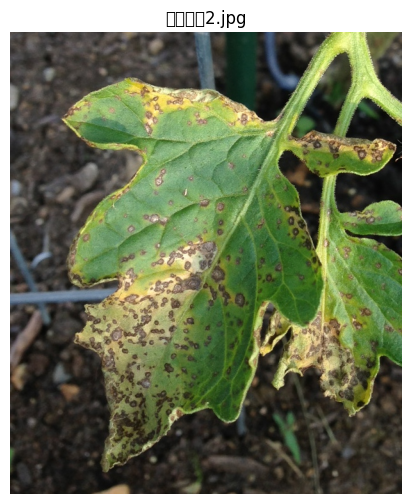

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2.jpg
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9890
2위: Tomato___Early_blight / 신뢰도: 0.0018
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9998
2위: Tomato___Bacterial_spot / 신뢰도: 0.0001
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
ConvNeXt Tiny Top1              : Tomato___Septoria_leaf_spot / 0.9890
ConvNeXt Tiny Preprocessed Top1 : Tomato___Septoria_leaf_spot / 0.9998
신뢰도 차이                     : +0.0108


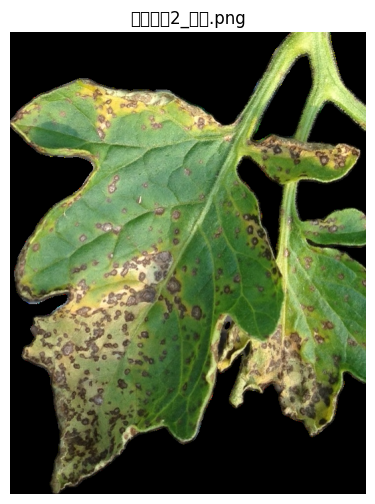

이미지: /home/harry/Re_leaf_Project/Test_image/셉토리아2_누끼.png
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9975
2위: Tomato___Early_blight / 신뢰도: 0.0025
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Target_Spot / 신뢰도: 0.0000
5위: Tomato___Late_blight / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.9999
2위: Tomato___Early_blight / 신뢰도: 0.0000
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Septoria_leaf_spot

[비교]
ConvNeXt Tiny Top1              : Tomato___Septoria_leaf_spot / 0.9975
ConvNeXt Tiny Preprocessed Top1 : Tomato___Septoria_leaf_spot / 0.9999
신뢰도 차이                     : +0.0025


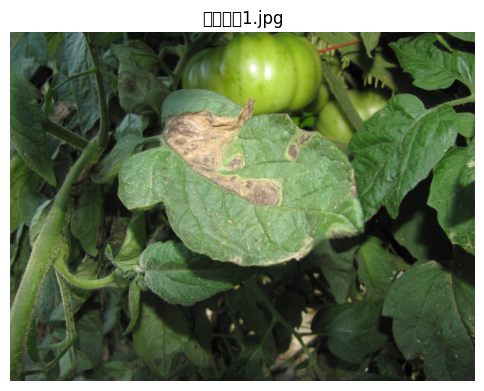

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병1.jpg
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0012
2위: Tomato___Late_blight / 신뢰도: 0.0011
3위: Tomato___Early_blight / 신뢰도: 0.0005
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.00)

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Early_blight / 신뢰도: 0.5351
2위: Tomato___Late_blight / 신뢰도: 0.3934
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0493
4위: Tomato___Bacterial_spot / 신뢰도: 0.0166
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.54)

[비교]
ConvNeXt Tiny Top1              : Tomato___Septoria_leaf_spot / 0.0012
ConvNeXt Tiny Preprocessed Top1 : Tomato___Early_blight / 0.5351
신뢰도 차이                     : +0.5339


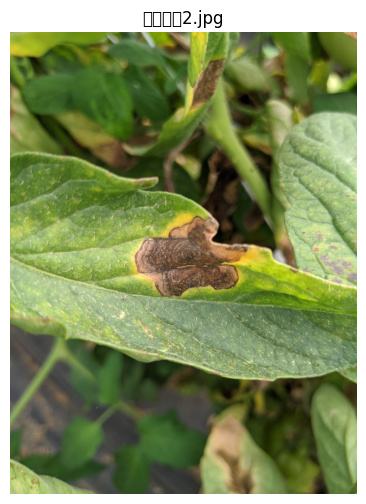

이미지: /home/harry/Re_leaf_Project/Test_image/전기역병2.jpg
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0110
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0018
3위: Tomato___Late_blight / 신뢰도: 0.0011
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.01)

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Early_blight / 신뢰도: 0.8706
2위: Tomato___Late_blight / 신뢰도: 0.0870
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0287
4위: Tomato___Bacterial_spot / 신뢰도: 0.0004
5위: Tomato___healthy / 신뢰도: 0.0000
최종: Tomato___Early_blight

[비교]
ConvNeXt Tiny Top1              : Tomato___Early_blight / 0.0110
ConvNeXt Tiny Preprocessed Top1 : Tomato___Early_blight / 0.8706
신뢰도 차이                     : +0.8596


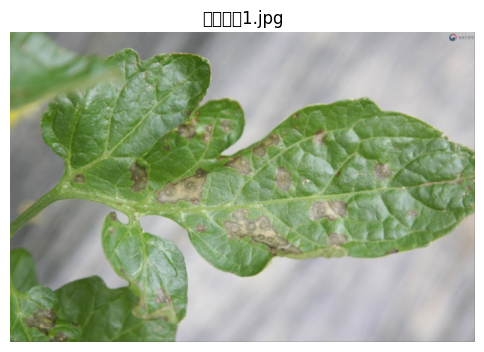

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병1.jpg
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Early_blight / 신뢰도: 0.0119
2위: Tomato___Target_Spot / 신뢰도: 0.0017
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0002
4위: Tomato___Late_blight / 신뢰도: 0.0000
5위: Tomato___healthy / 신뢰도: 0.0000
최종: 판단 어려움 (0.01)

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Early_blight / 신뢰도: 0.6497
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.1469
3위: Tomato___Late_blight / 신뢰도: 0.0375
4위: Tomato___Target_Spot / 신뢰도: 0.0065
5위: Tomato___Bacterial_spot / 신뢰도: 0.0006
최종: 판단 어려움 (0.65)

[비교]
ConvNeXt Tiny Top1              : Tomato___Early_blight / 0.0119
ConvNeXt Tiny Preprocessed Top1 : Tomato___Early_blight / 0.6497
신뢰도 차이                     : +0.6378


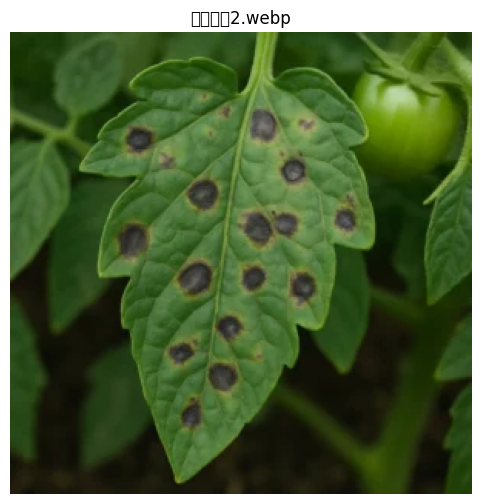

이미지: /home/harry/Re_leaf_Project/Test_image/점무늬병2.webp
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.6776
2위: Tomato___Early_blight / 신뢰도: 0.2849
3위: Tomato___healthy / 신뢰도: 0.0054
4위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0008
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: 판단 어려움 (0.68)

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9791
2위: Tomato___Early_blight / 신뢰도: 0.0204
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0004
4위: Tomato___healthy / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
ConvNeXt Tiny Top1              : Tomato___Late_blight / 0.6776
ConvNeXt Tiny Preprocessed Top1 : Tomato___Late_blight / 0.9791
신뢰도 차이                     : +0.3016


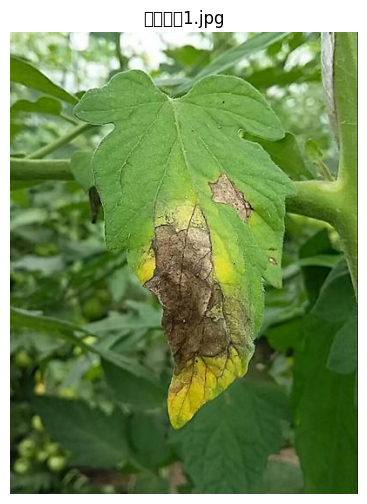

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병1.jpg
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9844
2위: Tomato___Early_blight / 신뢰도: 0.0035
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0004
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Target_Spot / 신뢰도: 0.0000
최종: Tomato___Late_blight

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9999
2위: Tomato___Early_blight / 신뢰도: 0.0001
3위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
ConvNeXt Tiny Top1              : Tomato___Late_blight / 0.9844
ConvNeXt Tiny Preprocessed Top1 : Tomato___Late_blight / 0.9999
신뢰도 차이                     : +0.0155


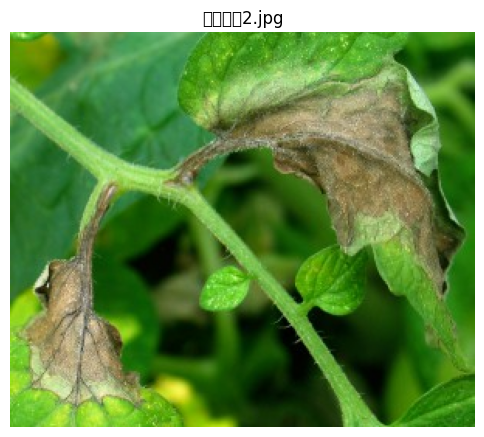

이미지: /home/harry/Re_leaf_Project/Test_image/후기역병2.jpg
선택 작물: Tomato

[ConvNeXt Tiny extra406 결과]
1위: Tomato___Late_blight / 신뢰도: 0.9514
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
3위: Tomato___Early_blight / 신뢰도: 0.0000
4위: Tomato___Bacterial_spot / 신뢰도: 0.0000
5위: Tomato___Tomato_Yellow_Leaf_Curl_Virus / 신뢰도: 0.0000
최종: Tomato___Late_blight

[ConvNeXt Tiny extra406 Preprocessed 결과]
1위: Tomato___Late_blight / 신뢰도: 1.0000
2위: Tomato___Septoria_leaf_spot / 신뢰도: 0.0000
3위: Tomato___Bacterial_spot / 신뢰도: 0.0000
4위: Tomato___Early_blight / 신뢰도: 0.0000
5위: Tomato___Leaf_Mold / 신뢰도: 0.0000
최종: Tomato___Late_blight

[비교]
ConvNeXt Tiny Top1              : Tomato___Late_blight / 0.9514
ConvNeXt Tiny Preprocessed Top1 : Tomato___Late_blight / 1.0000
신뢰도 차이                     : +0.0486


In [77]:
# =========================================================
# 테스트 이미지 실행
# =========================================================

for img_path in test_images:
    compare_convnext_vs_convnext_pre(
        img_path,
        selected_crop="Tomato",
        threshold=0.7
    )

In [78]:
# =========================================================
# class_38 -> class_names.json 저장
# =========================================================

import json

CLASS_JSON_PATH = "class_names_38.json"

with open(CLASS_JSON_PATH, "w", encoding="utf-8") as f:
    json.dump(
        class_38,
        f,
        ensure_ascii=False,
        indent=4
    )

print("class_names 저장 완료:", CLASS_JSON_PATH)

class_names 저장 완료: class_names_38.json
